## Import packages necessary for this notebook

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

import cartopy as cp
import cartopy.crs as ccrs
import cmocean #https://matplotlib.org/cmocean/

### Import sensor data pulled from the 2021 GEOTRACES IDP

In [2]:
## Load sensor data

sensor = pd.read_csv("C:/Users/nicol/OEAS_895/capstone_project/raw_data/IDP2021_sensors.txt", sep = '\t', skiprows = 25, low_memory = False)

print(sensor.columns)


Index(['Cruise', 'Station', 'Type', 'yyyy-mm-ddThh:mm:ss.sss',
       'Longitude [degrees_east]', 'Latitude [degrees_north]',
       'CTDPRS_T_VALUE_SENSOR [dbar]', 'QV:SEADATANET',
       'CTDTMP_T_VALUE_SENSOR [deg C]', 'QV:SEADATANET.1',
       'CTDSAL_D_CONC_SENSOR [pss-78]', 'QV:SEADATANET.2',
       'CTDOXY_D_CONC_SENSOR [umol/kg]', 'QV:SEADATANET.3',
       'CTDCHLA_T_CONC_SENSOR [mg/m^3]', 'QV:SEADATANET.4',
       'CTDFLUOR_T_VALUE_SENSOR [arbitrary units]', 'QV:SEADATANET.5',
       'CTDBEAMCP_T_VALUE_SENSOR [1/m]', 'QV:SEADATANET.6',
       'CTDPAR_T_VALUE_SENSOR [arbitrary units]', 'QV:SEADATANET.7',
       'QV:ODV:SAMPLE'],
      dtype='object')


,Cruise,Station,Type,yyyy-mm-ddThh:mm:ss.sss,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,...,QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
0,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,5.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
1,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,6.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
2,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,7.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
3,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,8.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
4,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,9.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2129997,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,5619.0,1,1.8800,1,...,0,NaN,9,0.014,0,NaN,9,NaN,9,1
2129998,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,5620.0,1,1.8801,1,...,0,NaN,9,0.014,0,NaN,9,NaN,9,1
2129999,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,5621.0,1,1.8803,1,...,0,NaN,9,0.014,0,NaN,9,NaN,9,1
2130000,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,5622.0,1,1.8805,1,...,0,NaN,9,0.014,0,NaN,9,NaN,9,1


#### Based on EDA within ODV, this dataset contains:  
         - two cruies transects that have BOTH fluorescence and beam attenuation:  GA03 and GIPY5
         - three cruise transects that have BOTH chlorophyll and beam attentuation:  GA02, GA10, and GApr08
         
         GA10 and GApr08 also have PAR -- GApr08 cruise did not pull in data extraction despite existing in data exploration
         GA03 and GP16 have pigment data
         
         GP15 and GP15 do not have beam cp data


#### Should be able to pull the data from the GP15 ODF hex and con CTD files.  
#### Might also be able to do the same for the GP16 dataset since that had really interesting Prochlorococcus abundance that would better relate to my research.

### Creating a subset of data that ignores everything below ~150 m (using 150 db as the cutoff).  This will help improve computing time by cutting down from the over 2.1 millon rows of data originally imported. 

In [3]:
# creating subsets for sesnor dataset to remove everything below 150db

sensor_150 = sensor[(sensor['CTDPRS_T_VALUE_SENSOR [dbar]']<150)]

sensor_150 # display 

,Cruise,Station,Type,yyyy-mm-ddThh:mm:ss.sss,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,...,QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
0,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,5.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
1,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,6.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
2,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,7.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
3,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,8.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
4,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,9.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2124623,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,245.0,1,12.1268,1,...,0,NaN,9,0.019,0,NaN,9,NaN,9,1
2124624,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,246.0,1,12.1095,1,...,0,NaN,9,0.020,0,NaN,9,NaN,9,1
2124625,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,247.0,1,12.0960,1,...,0,NaN,9,0.020,0,NaN,9,NaN,9,1
2124626,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,248.0,1,12.0849,1,...,0,NaN,9,0.019,0,NaN,9,NaN,9,1


#### Simply binning the data to the upper 250 db cut the full dataset down from 2.1 million rows to just under 200k which will helps with the computational efficiency of the dataset. 

## Cruises with fluorescence AND beam attenuation data

In [4]:
# GA03
GA03 = sensor_150[sensor_150['Cruise'].str.contains('GA03')]  # filtering the rows to pull specifically the GA03 cruise

GA03.describe()

,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,CTDSAL_D_CONC_SENSOR [pss-78],QV:SEADATANET.2,CTDOXY_D_CONC_SENSOR [umol/kg],QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
count,39746.000000,39746.000000,39746.000000,39746.0,39746.000000,39746.0,39746.000000,39746.0,39746.000000,39746.0,0.0,39746.0,39314.000000,39746.000000,39746.000000,39746.000000,0.0,39746.0,39746.0
mean,318.302709,28.473083,126.024553,0.0,19.417793,0.0,36.442656,0.0,179.702848,0.0,NaN,9.0,0.044402,0.116490,0.050757,0.018769,NaN,9.0,1.0
std,20.561427,7.865033,71.332643,0.0,3.907572,0.0,0.550755,0.0,45.078637,0.0,NaN,0.0,0.047988,0.960703,0.039430,0.236977,NaN,0.0,0.0
min,290.137080,17.349700,0.000000,0.0,10.103000,0.0,34.944000,0.0,51.500000,0.0,NaN,9.0,0.000000,0.000000,0.011697,0.000000,NaN,9.0,1.0
25%,295.830510,22.333000,64.000000,0.0,16.647000,0.0,36.085999,0.0,156.900000,0.0,NaN,9.0,0.010000,0.000000,0.027575,0.000000,NaN,9.0,1.0
50%,319.782900,28.643200,126.000000,0.0,18.975000,0.0,36.562000,0.0,200.500000,0.0,NaN,9.0,0.035000,0.000000,0.046590,0.000000,NaN,9.0,1.0
75%,337.997590,36.762200,188.000000,0.0,22.788000,0.0,36.768002,0.0,208.000000,0.0,NaN,9.0,0.054000,0.000000,0.062120,0.000000,NaN,9.0,1.0
max,350.340000,39.701700,249.580000,0.0,28.107000,0.0,37.638000,0.0,264.500000,0.0,NaN,9.0,0.557000,9.000000,3.132287,4.000000,NaN,9.0,1.0


In [5]:
# GIPY5
GIPY5 = sensor_150[sensor_150['Cruise'].str.contains('GIPY5')]  # filtering the rows to pull specifically the GIPY5 cruise

GIPY5.describe()

,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,CTDSAL_D_CONC_SENSOR [pss-78],QV:SEADATANET.2,CTDOXY_D_CONC_SENSOR [umol/kg],QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
count,45269.000000,45269.000000,45269.000000,45269.0,45177.000000,45269.000000,45146.000000,45269.000000,0.0,45269.0,0.0,45269.0,45135.000000,45269.000000,34954.000000,45269.000000,0.0,45269.0,45269.0
mean,254.679478,-61.267376,123.653273,0.0,0.673119,0.018291,34.260798,0.024454,NaN,9.0,NaN,9.0,0.773025,0.026729,0.107234,2.050741,NaN,9.0,1.0
std,132.728055,5.847155,69.680071,0.0,2.462452,0.405321,0.301557,0.468499,NaN,0.0,NaN,0.0,1.345580,0.489296,0.060126,3.775109,NaN,0.0,0.0
min,0.000000,-70.574900,1.000000,0.0,-1.920000,0.000000,31.361000,0.000000,NaN,9.0,NaN,9.0,-0.010000,0.000000,0.046270,0.000000,NaN,9.0,1.0
25%,295.530210,-66.028600,63.000000,0.0,-1.441000,0.000000,34.005001,0.000000,NaN,9.0,NaN,9.0,0.070000,0.000000,0.064920,0.000000,NaN,9.0,1.0
50%,306.384400,-62.000900,122.000000,0.0,0.273000,0.000000,34.325001,0.000000,NaN,9.0,NaN,9.0,0.240000,0.000000,0.086120,0.000000,NaN,9.0,1.0
75%,332.848820,-57.406300,183.000000,0.0,1.289000,0.000000,34.507999,0.000000,NaN,9.0,NaN,9.0,0.900000,0.000000,0.131330,0.000000,NaN,9.0,1.0
max,359.999910,-42.344200,249.000000,0.0,12.589000,9.000000,34.716000,9.000000,NaN,9.0,NaN,9.0,10.000000,9.000000,2.005480,9.000000,NaN,9.0,1.0


## Cruises with chlorophyll AND beam attenuation data

In [6]:
# GAO2
GA02 = sensor_150[sensor_150['Cruise'].str.contains('GA02')]  # filtering the rows to pull specifically the GA02 cruise

GA02.describe()

,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,CTDSAL_D_CONC_SENSOR [pss-78],QV:SEADATANET.2,CTDOXY_D_CONC_SENSOR [umol/kg],QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
count,32587.000000,32587.000000,32587.000000,32587.0,32587.000000,32587.0,32587.000000,32587.0,31961.000000,32587.000000,32339.000000,32587.000000,0.0,32587.0,30871.000000,32587.000000,0.0,32587.0,32587.0
mean,313.702592,11.353081,126.834842,1.0,16.651016,1.0,35.821494,1.0,209.221417,1.153681,0.087295,1.061497,NaN,9.0,0.077874,1.421272,NaN,9.0,1.0
std,11.535465,32.967889,70.763118,0.0,7.133678,0.0,0.869909,0.0,47.150314,1.098120,0.186815,0.696079,NaN,0.0,0.074241,1.786842,NaN,0.0,0.0
min,292.195400,-49.547500,1.000000,1.0,2.954000,1.0,32.120998,1.0,90.700000,1.000000,-0.010000,1.000000,NaN,9.0,0.030000,1.000000,NaN,9.0,1.0
25%,305.197110,-12.891300,66.000000,1.0,11.199500,1.0,35.145000,1.0,190.400000,1.000000,0.020000,1.000000,NaN,9.0,0.043000,1.000000,NaN,9.0,1.0
50%,314.269290,14.880400,127.000000,1.0,17.323000,1.0,35.896999,1.0,207.400000,1.000000,0.040000,1.000000,NaN,9.0,0.055000,1.000000,NaN,9.0,1.0
75%,321.033690,36.203500,188.000000,1.0,21.719000,1.0,36.584000,1.0,227.300000,1.000000,0.080000,1.000000,NaN,9.0,0.078000,1.000000,NaN,9.0,1.0
max,349.017090,64.000300,249.000000,1.0,29.324000,1.0,37.487000,1.0,310.100000,9.000000,2.340000,9.000000,NaN,9.0,0.814000,9.000000,NaN,9.0,1.0


In [7]:
# GA10
GA10 = sensor_150[sensor_150['Cruise'].str.contains('GA10')]  # filtering the rows to pull specifically the GA10 cruise

GA10.describe()

,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,CTDSAL_D_CONC_SENSOR [pss-78],QV:SEADATANET.2,CTDOXY_D_CONC_SENSOR [umol/kg],QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
count,7345.000000,7345.000000,7345.000000,7345.0,7345.000000,7345.0,7337.000000,7345.000000,7345.000000,7345.0,7345.000000,7345.0,0.0,7345.0,7345.000000,7345.000000,1923.000000,7345.000000,7345.0
mean,277.883049,-38.876507,125.795643,0.0,14.161970,0.0,35.184378,0.045745,224.085133,0.0,0.080357,0.0,NaN,9.0,0.061999,0.516814,0.002529,6.643703,1.0
std,116.444547,1.687555,71.517901,0.0,3.634793,0.0,0.546816,0.479514,20.702267,0.0,0.111393,0.0,NaN,0.0,0.076674,1.341792,0.011654,3.956851,0.0
min,5.517700,-40.257600,1.000000,0.0,6.386000,0.0,28.455000,0.000000,129.400000,0.0,0.000000,0.0,NaN,9.0,-0.053090,0.000000,0.000000,0.000000,1.0
25%,307.500790,-40.000000,63.000000,0.0,11.401000,0.0,34.894001,0.000000,209.300000,0.0,0.020000,0.0,NaN,9.0,0.011420,0.000000,0.000000,0.000000,1.0
50%,321.746220,-39.999300,125.000000,0.0,13.525000,0.0,35.173000,0.000000,226.900000,0.0,0.030000,0.0,NaN,9.0,0.037900,0.000000,0.000000,9.000000,1.0
75%,340.069790,-37.982800,187.000000,0.0,16.656000,0.0,35.455002,0.000000,240.900000,0.0,0.090000,0.0,NaN,9.0,0.086080,0.000000,0.000000,9.000000,1.0
max,359.500090,-34.612300,249.000000,0.0,24.387000,0.0,37.412998,9.000000,262.300000,0.0,0.700000,0.0,NaN,9.0,0.396540,4.000000,0.174000,9.000000,1.0


## Cruises that I might be able to pull data from the ODF hex and con CTD files - have GP15 - get GP16 from Greg

In [8]:
GP15 = sensor_150[sensor_150['Cruise'].str.contains('GP15')]  # filtering the rows to pull specifically the GP15 cruise
GP16 = sensor_150[sensor_150['Cruise'].str.contains('GP16')]  # filtering the rows to pull specifically the GP16 cruise

GP16.describe()

,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,CTDSAL_D_CONC_SENSOR [pss-78],QV:SEADATANET.2,CTDOXY_D_CONC_SENSOR [umol/kg],QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
count,45311.000000,45311.000000,45311.000000,45311.0,45311.000000,45311.000000,45311.000000,45311.000000,45311.000000,45311.000000,0.0,45311.0,45311.000000,45311.0,0.0,45311.0,0.0,45311.0,45311.0
mean,247.366349,-12.773310,125.363532,1.0,20.092089,0.985721,35.580875,0.980115,161.178392,0.627287,NaN,9.0,0.057680,0.0,NaN,9.0,NaN,9.0,1.0
std,22.843773,1.640991,70.911113,0.0,4.875403,0.118640,0.492901,0.139606,79.626825,0.521860,NaN,0.0,0.075452,0.0,NaN,0.0,NaN,0.0,0.0
min,207.999400,-17.573400,1.000000,1.0,11.092700,0.000000,34.601700,0.000000,-7.100000,0.000000,NaN,9.0,0.000000,0.0,NaN,9.0,NaN,9.0,1.0
25%,229.998900,-14.385600,64.000000,1.0,16.551650,1.000000,35.095650,1.000000,158.900000,0.000000,NaN,9.0,0.010000,0.0,NaN,9.0,NaN,9.0,1.0
50%,247.249600,-12.005400,125.000000,1.0,20.423300,1.000000,35.671398,1.000000,195.500000,1.000000,NaN,9.0,0.032000,0.0,NaN,9.0,NaN,9.0,1.0
75%,265.999910,-11.670100,187.000000,1.0,23.832750,1.000000,36.012901,1.000000,212.400000,1.000000,NaN,9.0,0.066000,0.0,NaN,9.0,NaN,9.0,1.0
max,282.623900,-10.250000,249.000000,1.0,29.381500,1.000000,36.497299,1.000000,261.600000,3.000000,NaN,9.0,1.347000,0.0,NaN,9.0,NaN,9.0,1.0


## Create a map with locations of all 4 (or 6) GEOTRACES cruises being examined 

C:\Users\nicol\anaconda3\envs\env_data_sci\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Users\nicol\anaconda3\envs\env_data_sci\lib\site-packages\cartopy\mpl\gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '


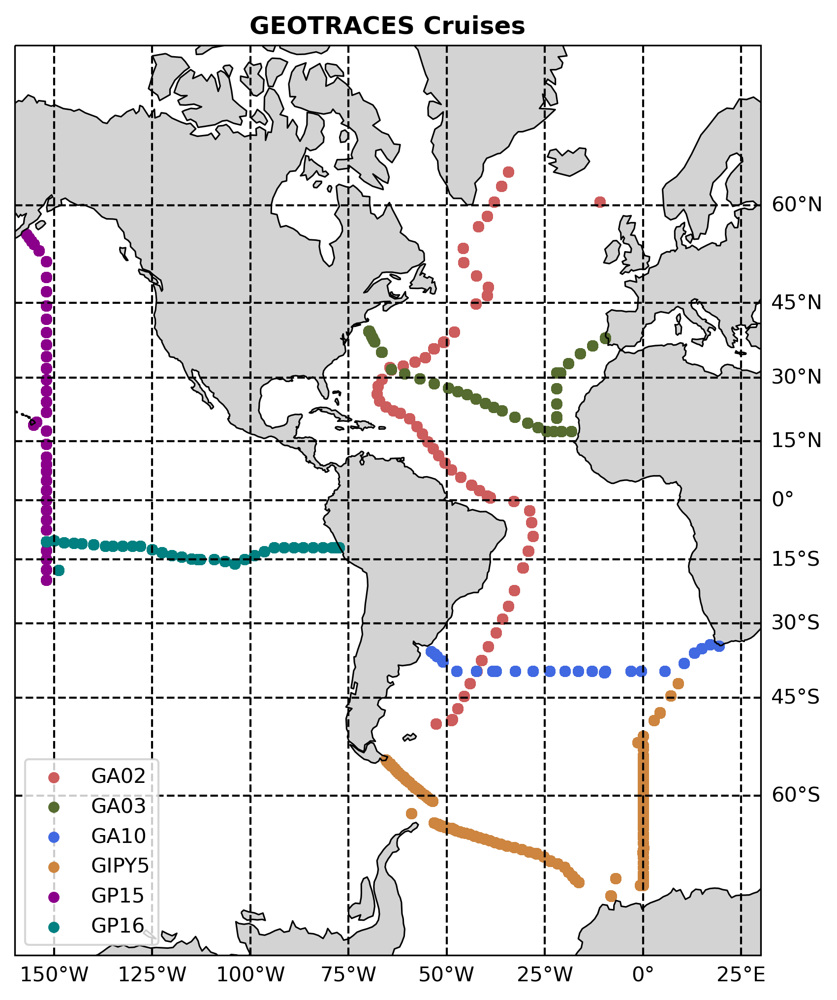

In [9]:
# create a global map of all GEOTRACES cruises focused on

fig = plt.figure(figsize = (10,8), dpi = 300)

ax = fig.add_subplot(1,1,1, projection = ccrs.Mercator(central_longitude = 0, min_latitude = -75, max_latitude = 75))

# (east, west, south, north) in terms of °E and °N
ax.set_extent([200, 30, -75, 75])

ax.set_title('GEOTRACES Cruises', color = 'k', weight = 'bold')

# add lines of latitude 
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels = True, linewidth = 1, color = 'k', linestyle = '--')
gl.xlabels_top = False
gl.ylabels_left = False

gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# mark lines of latitude
gl.ylocator = mticker.FixedLocator([-75, -60 , -45, -30, -15, 0, 15, 30, 45, 60, 75])

# coastlines and color
ax.coastlines(linewidth = 0.75, color = 'k')
#ax.add_feature(cp.feature.OCEAN, facecolor = 'powderblue')
ax.add_feature(cp.feature.LAND, facecolor = 'lightgrey')

# add bathymetry
#ax.add_feature(cp.feature.NaturalEarthFeature(category='physical', name='bathymetry_J_1000', scale='10m' ))

# plotting station locations of a cruise
nn = ax.scatter(GA02['Longitude [degrees_east]'], GA02['Latitude [degrees_north]'], c = 'indianred', s = 20, marker = 'o', label = 'GA02', transform = ccrs.PlateCarree())

# this one below is for adding another cruies subset ontop of the same map
nn = ax.scatter(GA03['Longitude [degrees_east]'], GA03['Latitude [degrees_north]'], c = 'darkolivegreen', s = 20, marker = 'o', label = 'GA03', transform = ccrs.PlateCarree())
nn = ax.scatter(GA10['Longitude [degrees_east]'], GA10['Latitude [degrees_north]'], c = 'royalblue', s = 20, marker = 'o', label = 'GA10', transform = ccrs.PlateCarree())
nn = ax.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['Latitude [degrees_north]'], c = 'peru', s = 20, marker = 'o', label = 'GIPY5', transform = ccrs.PlateCarree())
nn = ax.scatter(GP15['Longitude [degrees_east]'], GP15['Latitude [degrees_north]'], c = 'darkmagenta', s = 20, marker = 'o', label = 'GP15', transform = ccrs.PlateCarree())
nn = ax.scatter(GP16['Longitude [degrees_east]'], GP16['Latitude [degrees_north]'], c = 'teal', s = 20, marker = 'o', label = 'GP16', transform = ccrs.PlateCarree())


# plot legend to identify the cruises
plt.legend(loc='lower left', fontsize = "medium")

fig.savefig('GEOTRACES_cruise_map.png', dpi = 300)

# Transect profiles for each cruise:

### GA02

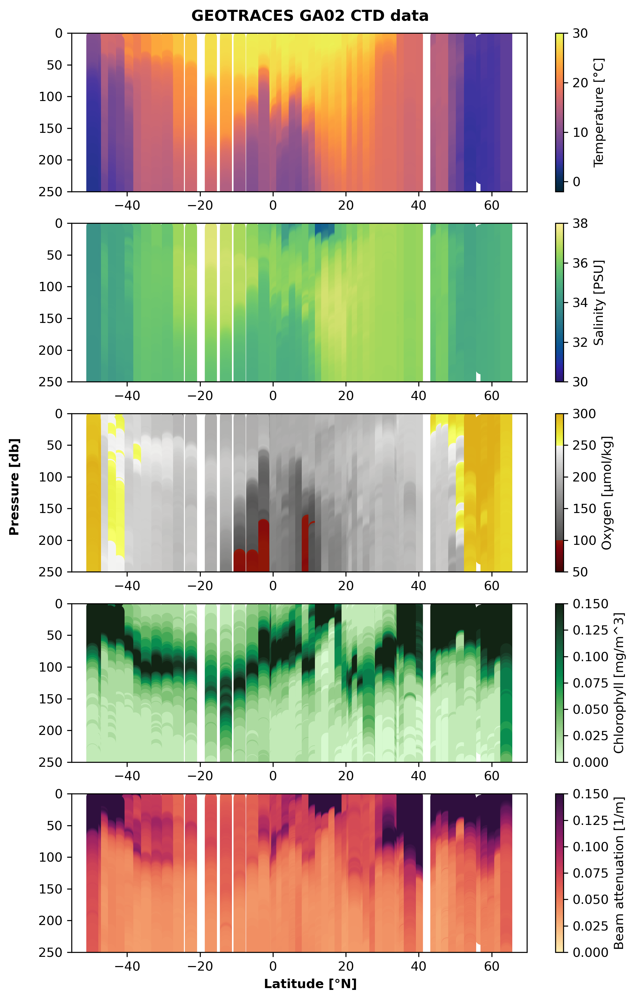

In [10]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA02 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(5, 1, 1)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(5, 1, 2)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(5, 1, 3)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(5, 1, 4)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Chlorophyll [mg/m^3]')

plt.subplot(5, 1, 5)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb5 = plt.colorbar()
cb5.set_label('Beam attenuation [1/m]')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Latitude [°N]', ha='center', weight = 'bold')

fig.savefig('GA02_section.png', dpi = 300)

## GA10

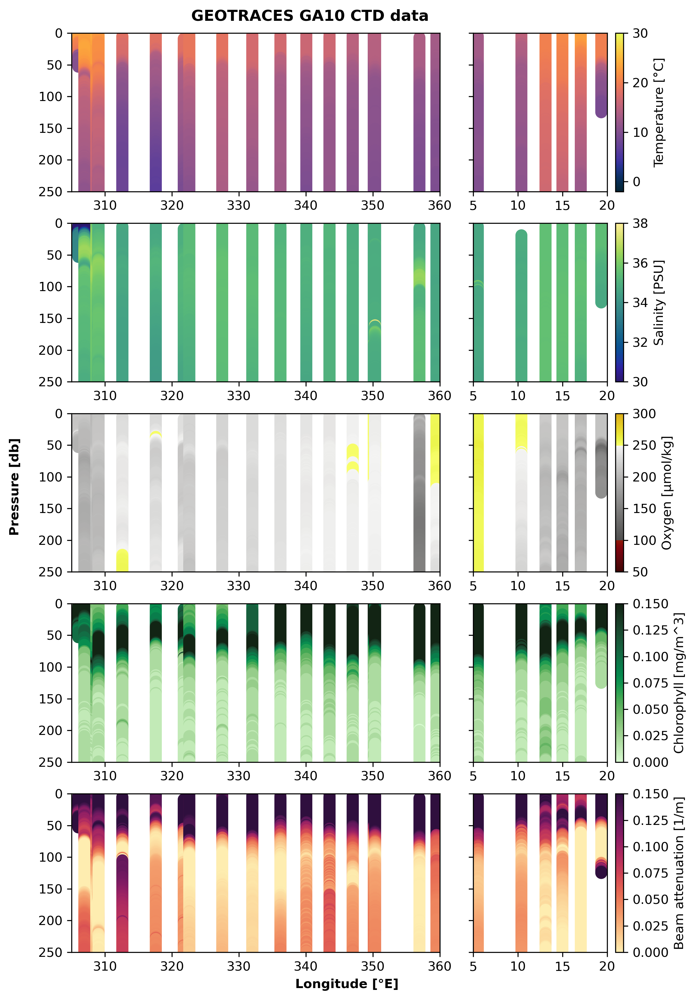

In [11]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA10 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 3, (1, 2))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([305, 360])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 3)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([5, 20])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(5, 3, (4, 5))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([305, 360])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 6)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([5, 20])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# oxygen
plt.subplot(5, 3, (7, 8))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([305, 360])
plt.ylim([0, 250])
plt.gca().invert_yaxis()


plt.subplot(5, 3, 9)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([5, 20])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')


# chlorophyll
plt.subplot(5, 3, (10, 11))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([305, 360])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 12)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([5, 20])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Chlorophyll [mg/m^3]')


# beam attenuation
plt.subplot(5, 3, (13, 14))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([305, 360])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 15)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([5, 20])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.5, 0.08, 'Longitude [°E]', ha='center', weight = 'bold')

fig.savefig('GA10_section.png', dpi = 300)

## GA03

In [12]:
#  Try separating the GA03 into two based on time

GA03_lat_sec = pd.concat([sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-16T19:36:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-18T10:36:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-19T05:21:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-21T16:00:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-23T14:09:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-24T09:51:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-26T04:08:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-27T21:20:00')],
                          sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-30T02:04:00')]])


GA03_lat_sec


,Cruise,Station,Type,yyyy-mm-ddThh:mm:ss.sss,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,...,QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
636395,GA03,GT10/2019,C,2010-10-16T19:36:00,350.340,38.3233,0.0,0,20.284,0,...,0,NaN,9,0.057,0,0.091028,0,NaN,9,1
636396,GA03,GT10/2019,C,2010-10-16T19:36:00,350.340,38.3233,1.0,0,20.279,0,...,0,NaN,9,0.057,0,0.091560,0,NaN,9,1
636397,GA03,GT10/2019,C,2010-10-16T19:36:00,350.340,38.3233,2.0,0,20.274,0,...,0,NaN,9,0.057,0,0.092174,0,NaN,9,1
636398,GA03,GT10/2019,C,2010-10-16T19:36:00,350.340,38.3233,3.0,0,20.269,0,...,0,NaN,9,0.056,0,0.092706,0,NaN,9,1
636399,GA03,GT10/2019,C,2010-10-16T19:36:00,350.340,38.3233,4.0,0,20.264,0,...,0,NaN,9,0.056,0,0.093238,0,NaN,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
609287,GA03,GT10/2186,C,2010-10-30T02:04:00,339.185,17.3517,245.0,0,12.450,0,...,0,NaN,9,0.006,0,0.047076,0,NaN,9,1
609288,GA03,GT10/2186,C,2010-10-30T02:04:00,339.185,17.3517,246.0,0,12.435,0,...,0,NaN,9,0.006,0,0.047076,0,NaN,9,1
609289,GA03,GT10/2186,C,2010-10-30T02:04:00,339.185,17.3517,247.0,0,12.424,0,...,0,NaN,9,0.007,0,0.047076,0,NaN,9,1
609290,GA03,GT10/2186,C,2010-10-30T02:04:00,339.185,17.3517,248.0,0,12.434,0,...,0,NaN,9,0.006,0,0.047481,0,NaN,9,1


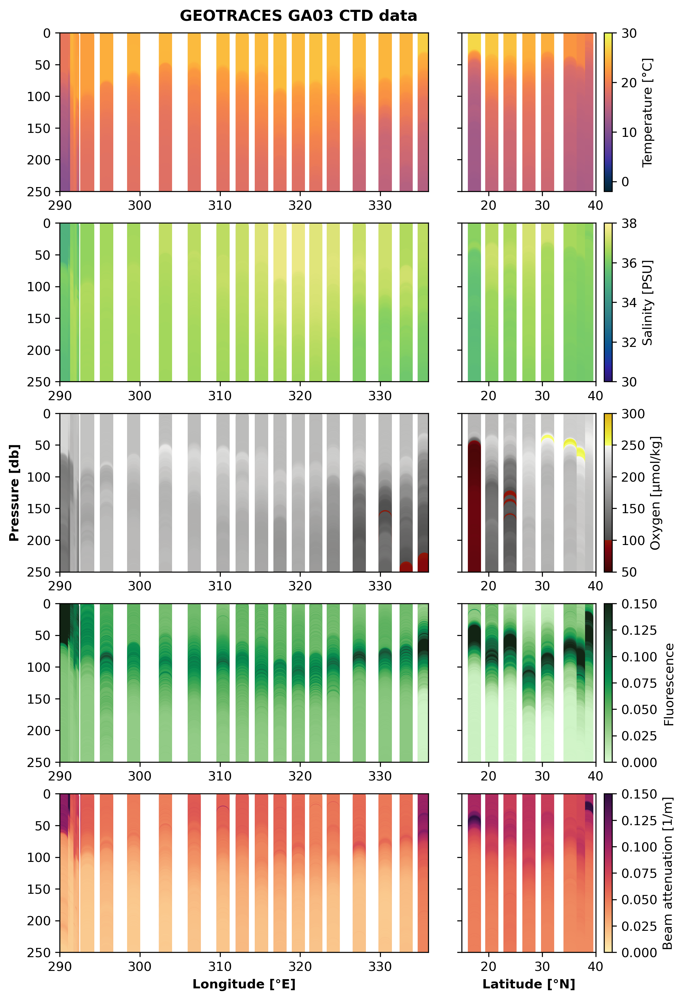

In [13]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA03 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 3, (1, 2))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([290, 336])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 3)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([15, 40])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(5, 3, (4, 5))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([290, 336])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 6)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([15, 40])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# oxygen
plt.subplot(5, 3, (7, 8))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([290, 336])
plt.ylim([0, 250])
plt.gca().invert_yaxis()
plt.ylabel('Pressure [db]', fontweight = 'bold')

plt.subplot(5, 3, 9)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([15, 40])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')


# chlorophyll
plt.subplot(5, 3, (10, 11))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([290, 336])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 12)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([15, 40])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Fluorescence')


# beam attenuation
plt.subplot(5, 3, (13, 14))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([290, 336])
plt.ylim([0, 250])
plt.gca().invert_yaxis()
plt.xlabel('Longitude [°E]', fontweight = 'bold')

plt.subplot(5, 3, 15)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([15, 40])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
plt.xlabel('Latitude [°N]', fontweight = 'bold')
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')


fig.savefig('GA03_section.png', dpi = 300)

## GIPY5

In [14]:
#  Try separating the GIPY5 into two based on time

GIPY5_lat_sec = pd.concat([sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-14T00:49:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-15T06:17:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-17T02:20:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-17T13:50:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-19T09:38:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-20T01:07:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-20T10:28:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T01:19:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T14:29:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T20:01:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T01:46:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T14:05:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T21:07:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-23T03:53:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-23T12:05:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-24T04:46:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T09:05:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T13:28:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T17:56:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-26T08:06:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-26T22:36:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-27T09:00:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-27T14:36:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-28T04:16:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-29T01:31:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-29T14:50:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-07T14:54:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-08T19:27:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-09T21:28:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-10T11:00:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-10T21:18:00')],
                           sensor_250[sensor_250['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-11T16:02:00')],
                          ])


GIPY5_lat_sec

,Cruise,Station,Type,yyyy-mm-ddThh:mm:ss.sss,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,...,QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
1547678,GIPY5,PS71_102_2,C,2008-02-15T06:17:00,7.09710,-44.6604,7.0,0,9.101,0,...,9,NaN,9,2.78,0,0.20854,0,NaN,9,1
1547679,GIPY5,PS71_102_2,C,2008-02-15T06:17:00,7.09710,-44.6604,8.0,0,9.108,0,...,9,NaN,9,2.71,0,0.21149,0,NaN,9,1
1547680,GIPY5,PS71_102_2,C,2008-02-15T06:17:00,7.09710,-44.6604,9.0,0,9.107,0,...,9,NaN,9,2.69,0,0.21023,0,NaN,9,1
1547681,GIPY5,PS71_102_2,C,2008-02-15T06:17:00,7.09710,-44.6604,10.0,0,9.100,0,...,9,NaN,9,2.74,0,0.20939,0,NaN,9,1
1547682,GIPY5,PS71_102_2,C,2008-02-15T06:17:00,7.09710,-44.6604,11.0,0,9.102,0,...,9,NaN,9,2.74,0,0.20939,0,NaN,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346641,GIPY5,PS71_177_1,C,2008-03-11T16:02:00,359.99631,-69.2995,245.0,0,0.025,0,...,9,NaN,9,0.17,0,0.05194,0,NaN,9,1
1346642,GIPY5,PS71_177_1,C,2008-03-11T16:02:00,359.99631,-69.2995,246.0,0,0.068,0,...,9,NaN,9,0.07,0,0.05194,0,NaN,9,1
1346643,GIPY5,PS71_177_1,C,2008-03-11T16:02:00,359.99631,-69.2995,247.0,0,0.107,0,...,9,NaN,9,0.07,0,0.05194,0,NaN,9,1
1346644,GIPY5,PS71_177_1,C,2008-03-11T16:02:00,359.99631,-69.2995,248.0,0,0.132,0,...,9,NaN,9,0.06,0,0.05234,0,NaN,9,1


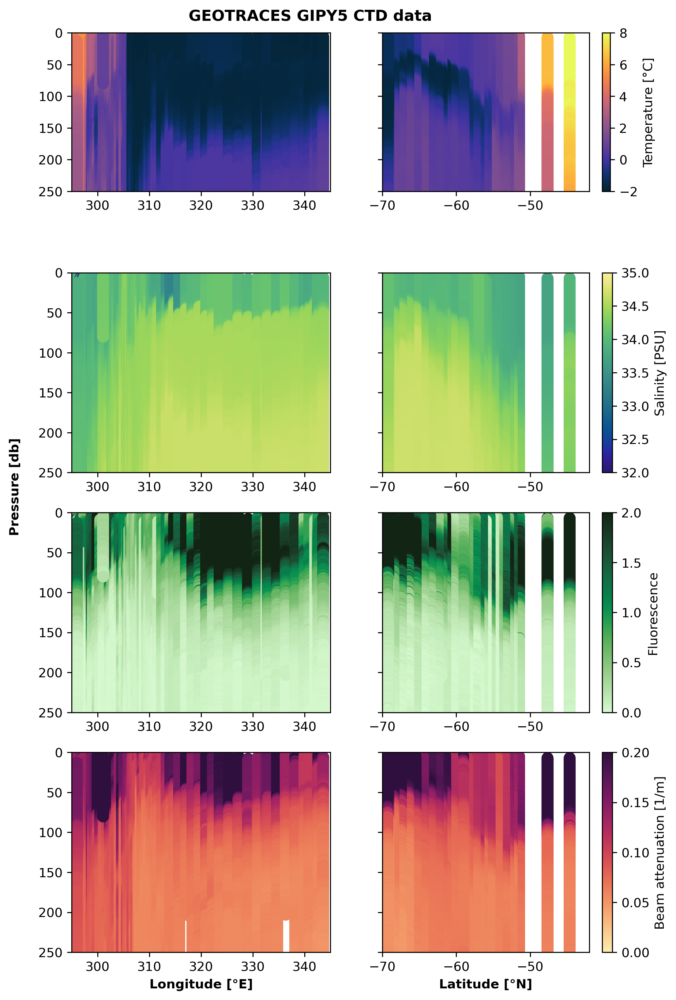

In [15]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GIPY5 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 2, 1)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=8)
plt.xlim([295, 345])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(5, 2, 2)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=8)
plt.xlim([-70, -42])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(4, 2, 3)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=32, vmax=35)
plt.xlim([295, 345])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(4, 2, 4)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=32, vmax=35)
plt.xlim([-70, -42])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# chlorophyll
plt.subplot(4, 2, 5)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=2)
plt.xlim([295, 345])
plt.ylim([0, 250])
plt.gca().invert_yaxis()

plt.subplot(4, 2, 6)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=2)
plt.xlim([-70, -42])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Fluorescence')


# beam attenuation
plt.subplot(4, 2, 7)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.2)
plt.xlim([295, 345])
plt.ylim([0, 250])
plt.gca().invert_yaxis()
plt.xlabel('Longitude [°E]', fontweight = 'bold')

plt.subplot(4, 2, 8)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.2)
plt.xlim([-70, -42])
plt.ylim([0, 250])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
plt.xlabel('Latitude [°N]', fontweight = 'bold')
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')

fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')

fig.savefig('GIPY5_section.png', dpi = 300)

### GP15

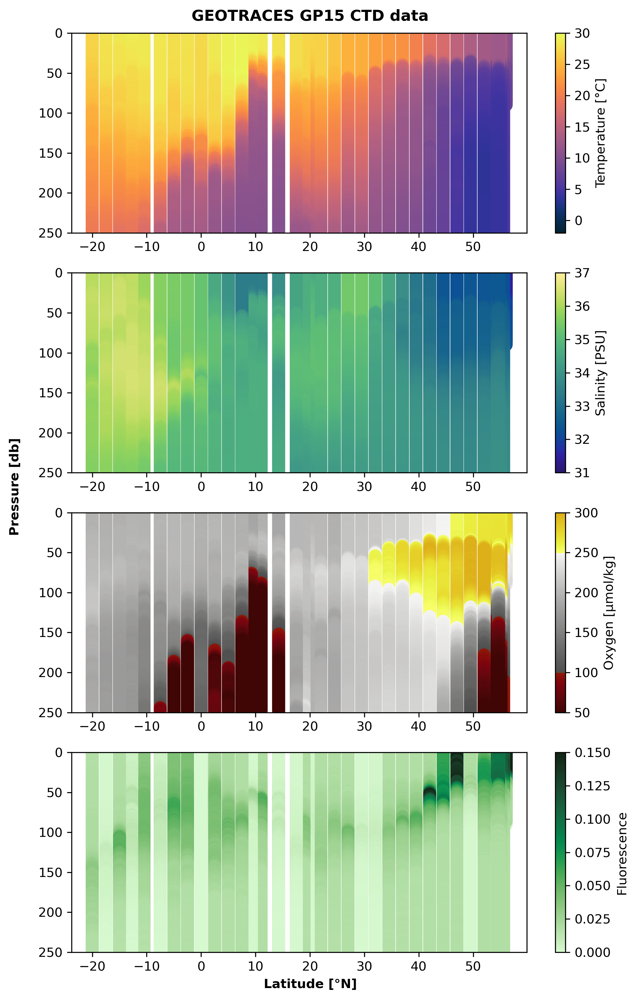

In [16]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GP15 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(4, 1, 1)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(4, 1, 2)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=31, vmax=37)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(4, 1, 3)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(4, 1, 4)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Fluorescence')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Latitude [°N]', ha='center', weight = 'bold')

fig.savefig('GP15_section.png', dpi = 300)

### GP16

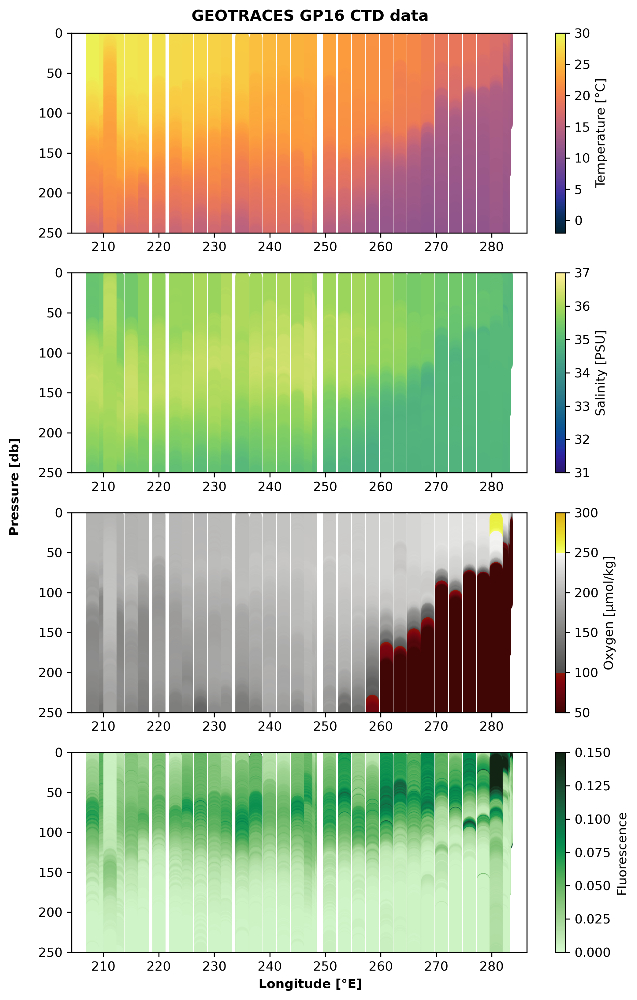

In [17]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GP16 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(4, 1, 1)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(4, 1, 2)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=31, vmax=37)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(4, 1, 3)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(4, 1, 4)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 250])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Fluorescence')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Longitude [°E]', ha='center', weight = 'bold')

fig.savefig('GP16_section.png', dpi = 300)